# [Work In Progres] Deconvolution Mouse Brain VisiumHD Data using Spotiphy
- by Ziqian Zheng <zzheng92@wisc.edu> and Jiyuan Yang <jiyuan.yang@stjude.org>.
- Last update: Oct 1st 2025

## Contents
1. [Data Preparation: Loading and Processing](#Load-data)
2. [Deconvolution: Marker Gene Selection and scRNA Reference Construction](#Marker)
3. [Deconvolution: Cellular Proportion Estimation](#Deconvolution)

In [6]:
import sys

sys.path.append("..")

import os
import spotiphy
import numpy as np
import pandas as pd
import matplotlib as mpl
import scanpy as sc
import torch

results_folder = "Spotiphy_result_hd/"
if not os.path.exists(results_folder):
    # Create result folder if it does not exist
    os.makedirs(results_folder)

## Data Preparation: Loading and Processing <a name="Load-data"></a>

Load the scRNA and VisiumHD data. The VisiumHD dataset is saved as an h5ad file, but users may also load it directly from the 'outs' folder using the function `spotiphy.load_visium_hd_to_anndata`.

In [7]:
adata_sc = sc.read_h5ad("data/scRNA_mouse_brain.h5ad")
# adata_st = sc.read_h5ad("data/VisiumHD_mouse_brain.h5ad")
# Load from the 'outs' folder directly
adata_st = spotiphy.load_visium_hd_to_anndata(
    "C:/Data/StJude/X896930AVM/outs", bin_size_um=16
)

adata_st.var_names_make_unique()
adata_st.obsm["spatial"] = adata_st.obsm["spatial"].astype(np.int32)
X = adata_st.X.toarray() if not isinstance(adata_st.X, np.ndarray) else adata_st.X
adata_st = adata_st[X.sum(axis=1) > 100, :].copy()
print(f"There are {adata_st.n_obs} spots and {adata_st.n_vars} genes in the ST data.")

adata_sc.var_names = [gene.upper() for gene in adata_sc.var_names]
adata_st.var_names = [gene.upper() for gene in adata_st.var_names]

key_type = "celltype"
type_list = sorted(list(adata_sc.obs[key_type].unique().astype(str)))
print(f"There are {len(type_list)} cell types: {type_list}")

anndata.py (1908): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1908): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


There are 55581 spots and 18085 genes in the ST data.
There are 14 cell types: ['Astro', 'CA', 'DG', 'L2/3 IT CTX', 'L4 IT CTX', 'L4/5 IT CTX', 'L5 IT CTX', 'L5 PT CTX', 'L5/6 IT CTX', 'L6 CT CTX', 'L6b CTX', 'Microglia', 'Oligo', 'SUB']


Verify all inputs carefully before proceeding.

scatterplots.py (392): No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


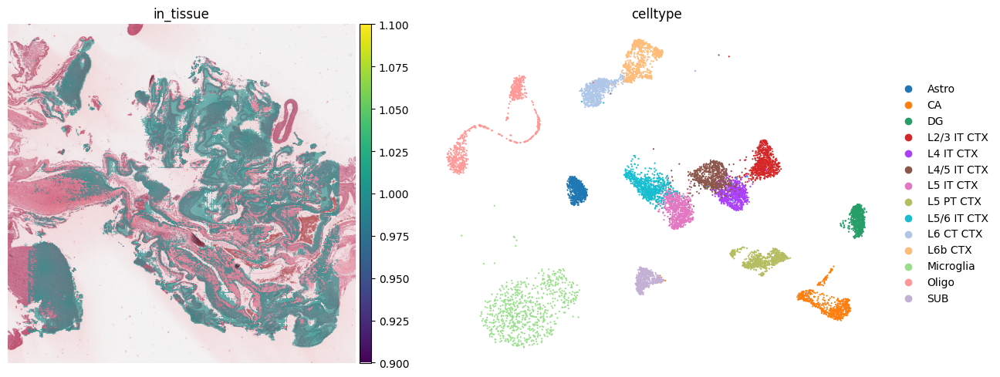

In [8]:
fig, axs = mpl.pyplot.subplots(1, 2, figsize=(14, 5))
sc.pl.spatial(
    adata_st,
    color="in_tissue",
    frameon=False,
    show=False,
    ax=axs[0],
    img_key="hires",
)
sc.pl.umap(adata_sc, color=key_type, size=10, frameon=False, show=False, ax=axs[1])
mpl.pyplot.tight_layout()
mpl.pyplot.savefig(f"{results_folder}qc.jpg", bbox_inches="tight", dpi=400)

## Deconvolution: Marker Gene Selection and scRNA Reference Construction  <a name="Marker"></a>
Initialize the spatial transcriptomics and scRNA data. Specifically,
- `adata_sc` and `adata_st` are normalized
- cells and genes in `adata_sc` are filtered
- only the common genes shared by `adata_sc` and `adata_st` are kept

In [9]:
adata_sc, adata_st = spotiphy.initialization(adata_sc, adata_st, verbose=1)

Convert expression matrix to array: 0.83s
Normalization: 3.08s
Filtering: 1.64s
Find common genes: 0.01s


Select marker genes based on pairwise statistical tests. The selected marker genes are saved as a CSV file.

Users can adjust the following arguments:

- `n_select`: the maximum number of marker genes select for each cell type
- `threshold_p`: threshold of the $p$-value to be considered significant
- `threshold_fold`: threshold of the fold-change to be considered significant
- `q`: Since more than one $p$-values are obtained in using the pairwise tests, we only consider the $p$-value at quantile `q`. For additional details, please refer to the supplementary material of the paper.
- `return_dict`: Whether return a dictionary representing the marker genes selected for each cell type, or just return the list of all selected marker genes.

The parameters specified in the following code block provide a good starting point.

In [10]:
marker_gene_dict = spotiphy.sc_reference.marker_selection(
    adata_sc,
    key_type=key_type,
    return_dict=True,
    n_select=50,
    threshold_p=0.1,
    threshold_fold=1.5,
    q=0.15,
)
marker_gene = []
marker_gene_label = []
for type_ in type_list:
    marker_gene.extend(marker_gene_dict[type_])
    marker_gene_label.extend([type_] * len(marker_gene_dict[type_]))
marker_gene_df = pd.DataFrame({"gene": marker_gene, "label": marker_gene_label})
marker_gene_df.to_csv(f"{results_folder}marker_gene.csv")
# Filter scRNA and spatial matrices with marker genes
adata_sc_marker = adata_sc[:, marker_gene]
adata_st_marker = adata_st[:, marker_gene]

Construct the single-cell reference and visualize selected marker genes with heatmaps.

Adjust parameters in the previous step as needed to optimize marker gene selection:
- If several cell types are very similar (e.g., T cell subtypes), try setting `q=0.3` or adjust accordingly.
- If there are limited marker genes for each cell type, try setting `threshold_fold=1.2` or adjust as needed.

14it [00:00, 1215.97it/s]


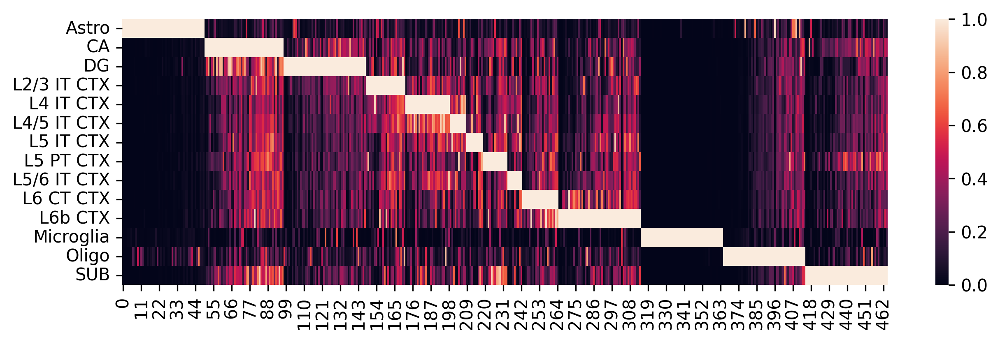

In [11]:
sc_ref = spotiphy.construct_sc_ref(adata_sc_marker, key_type=key_type)
spotiphy.sc_reference.plot_heatmap(
    adata_sc_marker, key_type, save=True, out_dir=results_folder
)

Another opinion will be input your customized marker gene list. Use the following code:
```python
#marker_gene = pd.read_csv(results_folder+'customized_marker_genes.csv', header=0)
```

## Deconvolution: Cellular Proportion Estimation <a name="Deconvolution"></a>
For performing the deconvolution, we calculate the posterior distribution of certain parameters within a probabilistic generative model using [`Pyro`](https://pyro.ai/).

Parameters of the function `estimation_proportion`:

- `X`: Spatial transcriptomics data. n_spot*n_gene.
- `adata_sc`: scRNA data (Anndata).
- `sc_ref`: Single cell reference. n_type*n_gene.
- `type_list`: List of the cell types.
- `key_type`: Column name of the cell types in adata_sc.
- `batch_prior`: Parameter involved in the prior distribution of the batch effect factors. It is recommended to select from $[1, 2]$.
- `n_epoch`: Number of training epoch.

100%|██████████| 8000/8000 [07:27<00:00, 17.89it/s]


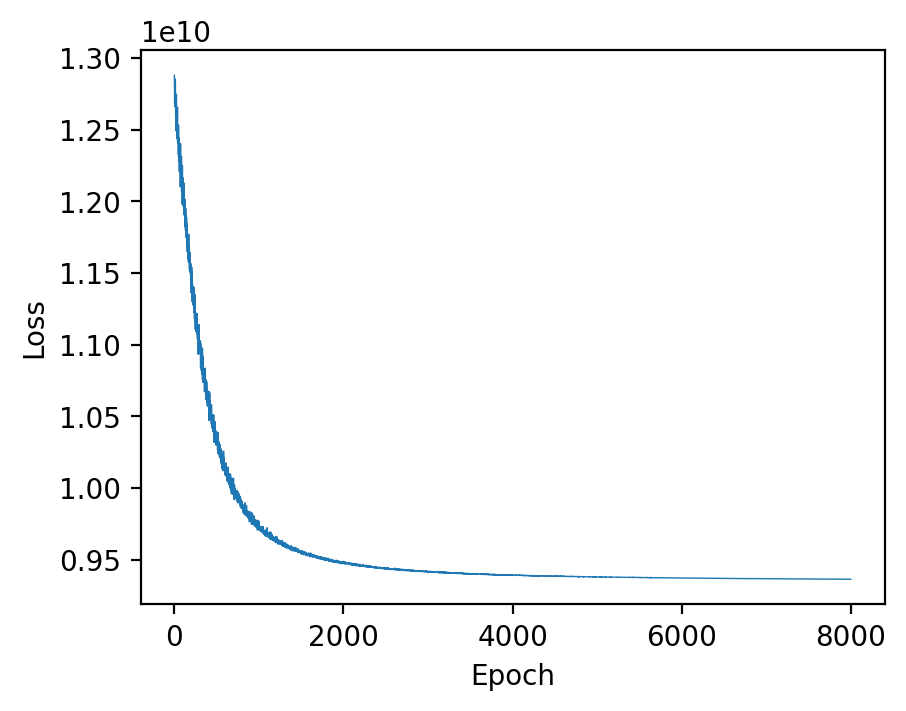

875694838.py (14): Trying to modify attribute `.obs` of view, initializing view as actual.


In [12]:
device = "cuda" if torch.cuda.is_available() else "cpu"
X = np.array(adata_st_marker.X)
cell_proportion = spotiphy.deconvolution.estimation_proportion(
    X,
    adata_sc_marker,
    sc_ref,
    type_list,
    key_type,
    n_epoch=8000,
    plot=True,
    batch_prior=1,
    device=device,
)
adata_st.obs[type_list] = cell_proportion
# Save the cellular proportions for future usage
np.save(f"{results_folder}proportion.npy", cell_proportion)
np.savetxt(f"{results_folder}proportion.csv", adata_st.obs[type_list], delimiter=",")

Generate heatmaps of cellular proportions.

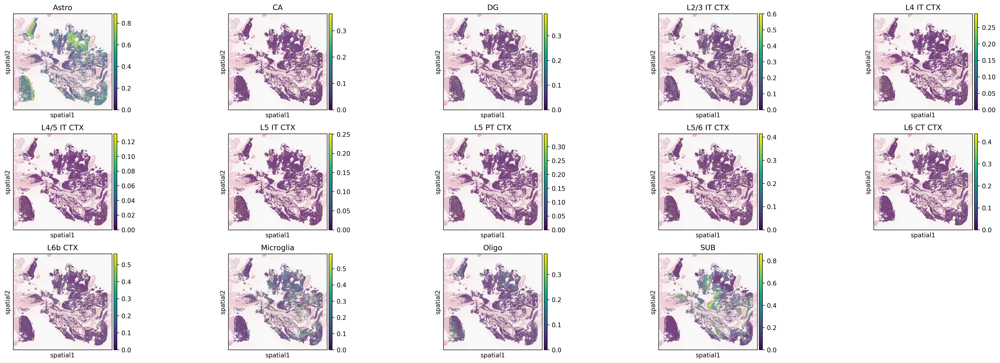

In [20]:
vmax = np.quantile(adata_st.obs[type_list].values, 0.98, axis=0)
vmax[vmax < 0.05] = 0.05
with mpl.rc_context(
    {"figure.figsize": [5, 3], "figure.dpi": 300, "xtick.labelsize": 0}
):
    ax = sc.pl.spatial(
        adata_st,
        cmap="viridis",
        color=type_list,
        img_key="hires",
        vmin=0,
        vmax=list(vmax),
        show=False,
        ncols=5,
        alpha_img=0.4,
    )
    ax[0].get_figure().savefig(f"{results_folder}Spotiphy_deconvolution.jpg")

In [ ]:
import geopandas as gpd

segmentation_df = gpd.read_file(
    "C:/Data/StJude/X896930AVM/outs/segmented_outputs/cell_segmentations.geojson"
)
segmentation_df["centroid"] = segmentation_df.geometry.centroid
segmentation_df["x"] = segmentation_df["centroid"].x
segmentation_df["y"] = segmentation_df["centroid"].y

cell_coords = segmentation_df[["x", "y"]].values
scale_factor = adata_st.uns["spatial"][list(adata_st.uns["spatial"].keys())[0]][
    "scalefactors"
]

spot_radius = scale_factor = adata_st.uns["spatial"][
    list(adata_st.uns["spatial"].keys())[0]
]["scalefactors"]
bin_size_um = scale_factor["bin_size_um"]
microns_per_pixel = scale_factor["microns_per_pixel"]

n_cell_df = spotiphy.segmentation.Segmentation.n_cell_in_spot(
    cell_coords,
    adata_st.obsm["spatial"],
    spot_radius=bin_size_um / microns_per_pixel / 2,
)

cell_number = spotiphy.deconvolution.proportion_to_count(
    cell_proportion, n_cell_df["cell_count"].values, multiple_spots=True
)

segmentation_df = spotiphy.deconvolution.assign_type_spot(
    segmentation_df, n_cell_df, cell_number, type_list
)

1792171351.py (6): Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

